# Conversion Rate Challenge

www.datascienceweekly.org est une célèbre lettre d'information rédigée par des data scientists indépendants. Tout le monde peut enregistrer son adresse e-mail sur ce site pour recevoir chaque semaine des informations sur la science des données et ses applications !

Les data scientists qui ont créé la newsletter aimeraient mieux comprendre le comportement des utilisateurs qui visitent leur site web. Ils aimeraient savoir s'il est possible de construire un modèle qui prédit si un utilisateur donné va s'abonner à la newsletter, en utilisant seulement quelques informations sur l'utilisateur. Ils aimeraient analyser les paramètres du modèle pour mettre en évidence les caractéristiques qui sont importantes pour expliquer le comportement des utilisateurs, et peut-être découvrir un nouveau levier d'action pour améliorer le taux de conversion de la lettre d'information.
Ils ont conçu un concours visant à construire un modèle permettant de prédire les *conversions* (c'est-à-dire le moment où un utilisateur s'inscrira à la newsletter). Pour ce faire, ils ont mis à disposition un ensemble de données contenant des informations sur le trafic de leur site web. Pour évaluer le classement des différentes équipes en compétition, ils ont décidé d'utiliser le **f1-score**.

## EDA

In [14]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import seaborn as sns

In [2]:
data = pd.read_csv('data/conversion_data_train.csv')
data.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


In [3]:
display(f"Nb rows : {data.shape[0]}, Nb columns : {data.shape[1]}")
display(data.head())
print("Describe : ")
display(data.describe(include="all"))
print("Missing value %")
display(data.isna().sum() * 100 / len(data))

'Nb rows : 284580, Nb columns : 6'

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


Describe : 


,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


Missing value %


country                0.0
age                    0.0
new_user               0.0
source                 0.0
total_pages_visited    0.0
converted              0.0
dtype: float64

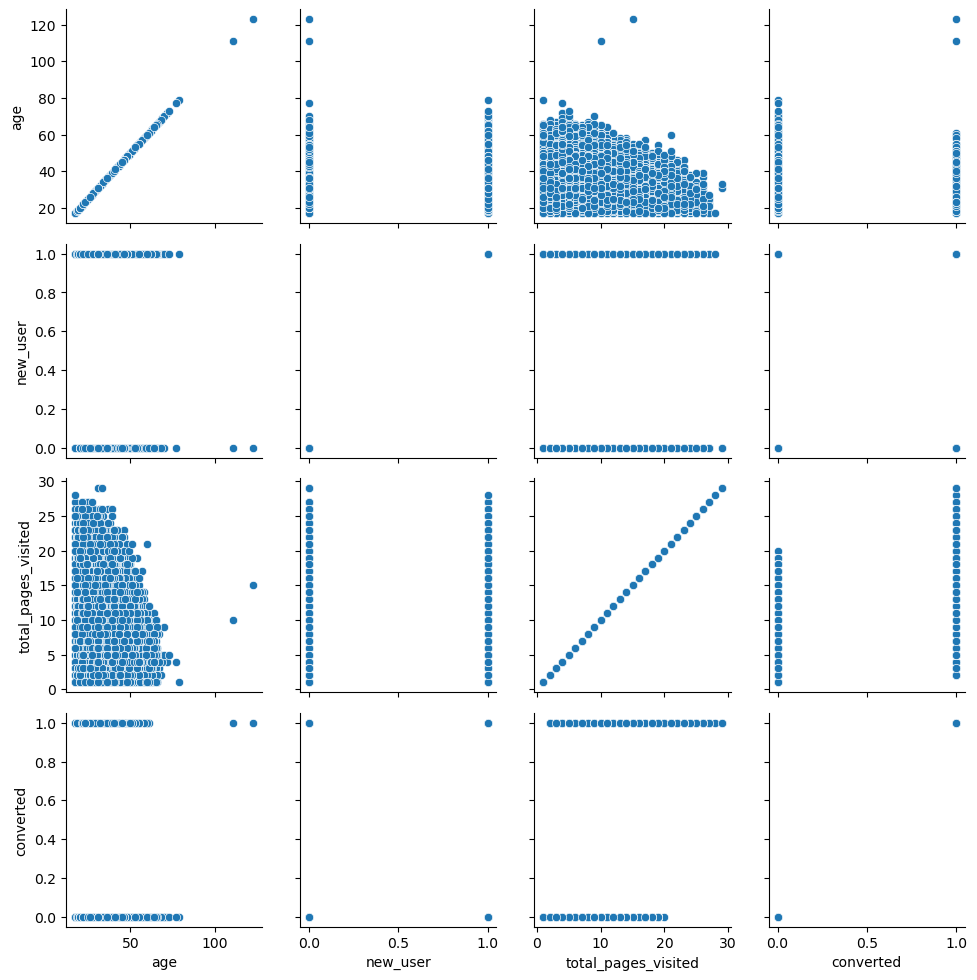

In [4]:
g = sns.PairGrid(data)
g.map(sns.scatterplot)

<Axes: >

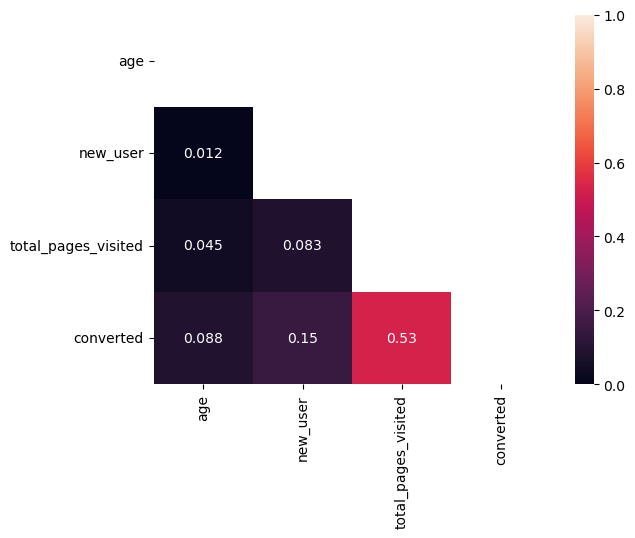

In [5]:
corr = data.corr(numeric_only=True).abs()
heatmap_mask = np.triu(corr)
sns.heatmap(corr, annot=True, vmin=0, vmax=+1, mask=heatmap_mask)

In [6]:
fig = go.Figure(layout=go.Layout(width=1000, height=700))
fig = make_subplots(
    rows=3, 
    cols=1,
    subplot_titles=('Age',  'Nb pages visités', 'Source'),
    figure=fig
)

trace1 = px.histogram(
    data,
    x="age"
)
trace2 = px.histogram(
    data,
    x="total_pages_visited"
)
trace3 = px.histogram(
    data,
    x="source"
)

fig.add_trace(go.Histogram(x=trace1.data[0]['x'], y=trace1.data[0]['y']), row=1, col=1)
fig.add_trace(go.Histogram(x=trace2.data[0]['x'], y=trace2.data[0]['y']), row=2, col=1)
fig.add_trace(go.Histogram(x=trace3.data[0]['x'], y=trace3.data[0]['y']), row=3, col=1)

fig.update_layout(showlegend=False)
fig
fig.show()

On remarque qu'il y a aucune données manquantes mais qu'il existe quelques outliers pour l'age et le nombre de pages visitées.

## Preprocessing

Toutes les colonnes sont complètes, aucune ne présente des uid ni ont trop de modalité, donc on peut toutes les garder.

Concernant les lignes, ont n'a aucune valeur aberrante juste quelques outliers que l'ont va supprimés.

In [16]:
numeric_features = ['age', 'total_pages_visited']
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_features = ['country', 'new_user', 'source']
categorical_transformer = Pipeline(steps=[
    ('encoder', OneHotEncoder(drop='first'))
])

preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('cat', categorical_transformer, categorical_features)
])

def preprocessing(X, Y): 
    '''
    Return X_train, X_test, Y_train, Y_test preprossed
    '''

    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, stratify=Y)
    X_train = preprocessor.fit_transform(X_train)
    X_test = preprocessor.transform(X_test)

    return (X_train, X_test, Y_train, Y_test)

In [62]:
def create_model(model, std = 0, scoring_df = None):
    '''
    Return the model already fit + scoring_df
    '''
    
    # Remove outliers
    if (std > 0):
        mask = ((data["age"] < data["age"].mean() + std*data["age"].std())
                & (data["total_pages_visited"] < data["total_pages_visited"].mean() + std*data["total_pages_visited"].std()))
        data_without_outlier = data.loc[mask, :]
    else:
        data_without_outlier = data
        
    target_name = "converted"
    
    Y = data_without_outlier[target_name]
    X = data_without_outlier.drop(target_name, axis=1)
    
    X_train, X_test, Y_train, Y_test = preprocessing(X, Y)
    
    model.fit(X_train, Y_train)
    
    training_score = model.score(X_train, Y_train)
    test_score = model.score(X_test, Y_test)
    # print("  score on training set : ", training_score)
    # print("  score on test set : ", test_score)
    
    X_score = preprocessor.fit_transform(X)
    scores = cross_val_score(model, X_score, Y, cv=5)
    # print('  The cross-validated score is : ', scores.mean())
    # print('  The standard deviation is : ', scores.std())
    
    try:
        new_score = pd.DataFrame(
            [[std, training_score, test_score, scores.mean(), scores.std()]],
            columns=["outlier_std", "score_train", "score_test", "cv_score", "sv_std"])
        scoring_df = pd.concat([scoring_df, new_score])
    except Exception as e:
        print(e)
    
    return (model, scoring_df)

## Baseline

On commence avec un model simple, une regression logisitique.

In [67]:
models_df = pd.DataFrame(columns=["outlier_std", "score_train", "score_test", "cv_score", "sv_std"])

for i in range(0, 25, 2):
    _, models_df = create_model(LogisticRegression(), i / 10, models_df)

_, models_df = create_model(LogisticRegression(), 0, models_df)

models_df

,outlier_std,score_train,score_test,cv_score,sv_std
0,0.0,0.986331,0.985769,0.986215,4.039668e-04
0,0.2,0.999282,0.999293,0.999284,1.765692e-05
0,0.4,0.998808,0.998808,0.998808,1.723263e-08
0,0.6,0.998899,0.998899,0.998899,0.000000e+00
0,0.8,0.998312,0.998298,0.998309,1.322047e-05
0,1.0,0.997339,0.997340,0.997339,2.597557e-08
0,1.2,0.997449,0.997443,0.997448,9.197247e-06
0,1.4,0.996124,0.996114,0.996122,1.032086e-05
0,1.6,0.994518,0.994528,0.994520,9.838395e-06
0,1.8,0.994644,0.994634,0.994642,9.603947e-06


On remarque que enlever les outlier de 2 ecart-type permet d'obtenir le meilleur résultat.